inspired from https://analyticsindiamag.com/my-experiment-with-unet-building-an-image-segmentation-model/ and https://www.kaggle.com/c0conuts/unet-imagedatagenerator-lb-0-336

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
import time
import scipy 
import skimage
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ModelCheckpoint


from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint

from skimage.feature import peak_local_max

#import tensorflow as tf

def dice_coefficient(y_true, y_pred):
  numerator = 2 * tf.reduce_sum(y_true * y_pred)
  denominator = tf.reduce_sum(y_true + y_pred)
  return numerator / (denominator + tf.keras.backend.epsilon())



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Set some parameters
BATCH_SIZE = 20 #20 # the higher the better WATCHOUT too big problem of GPU memory
IMG_WIDTH = 1440 
IMG_HEIGHT = 1920 
IMG_CHANNELS = 3
OVERLAP=16
seed = 42
CUT=3
NEW_IMG_WIDTH = int(IMG_WIDTH/CUT+2*OVERLAP) # once cut and overlapped
NEW_IMG_HEIGHT = int(IMG_HEIGHT/CUT+2*OVERLAP) 

print(NEW_IMG_WIDTH, NEW_IMG_HEIGHT)

512 672


In [ ]:
def cut_image(img,k=CUT, o=OVERLAP):
  images=[]
  [height, width, channels] = np.shape(img)
  margin_img=np.zeros((height+2*o, width+2*o, channels))
  margin_img[o:-o, o:-o,:]=img
  dh, dw=int(height/k), int(width/k)
  for h in range(k):
    for w in range(k):
      h1,h2=int(dh*h), int(dh*(h+1)+2*o)
      w1,w2=int(dw*w), int(dw*(w+1)+2*o)
      #add overlap
      h1,h2=np.max([h1,0]), np.min([h2, height+2*o])
      w1,w2=np.max([w1,0]) , np.min([w2, width+2*o])
      im=margin_img[h1: h2, w1:w2,:]
      images.append(im)
  return images

def assemble_mask(masks,k=CUT, o=OVERLAP):
  [height_o, width_o] = np.shape(masks[0])
  height, width= height_o-2*o, width_o-2*o
  mask=np.zeros((k*height, k*width))
  dh, dw=height, width
  for h in range(k):
    for w in range(k):
      h1,h2=int(dh*h), int(dh*(h+1))
      w1,w2=int(dw*w), int(dw*(w+1))
      m=masks[0]
      mask[h1: h2, w1:w2]= m[o:-o, o:-o]
      masks.pop(0)
  return mask

# Import data

In [ ]:
code_dir='/content/drive/Shared drives/fir_cone_detector'

masks_dir=code_dir+'/data/masks'
images_dir=code_dir+'/data/images'
images_list = os.listdir(images_dir)
masks_list = os.listdir(masks_dir)
print(masks_list[:5])
print(images_list[:5])
print('nb of masks=', len(masks_list), 'nb of images=', len(images_list))

['tree21_cone.ome.tiff', 'tree1_cone.ome.tiff', 'tree4_cone.ome.tiff', 'tree3_cone.ome.tiff', 'tree2_cone.ome.tiff']
['tree46.jpg', 'tree43.jpg', 'tree42.jpg', 'tree40.jpg', 'tree41.jpg']
nb of masks= 36 nb of images= 51


min mask= 0 max mask= 1
mask shape= (1920, 1440)
min img= 0 max img= 255
img shape= (1920, 1440, 3)


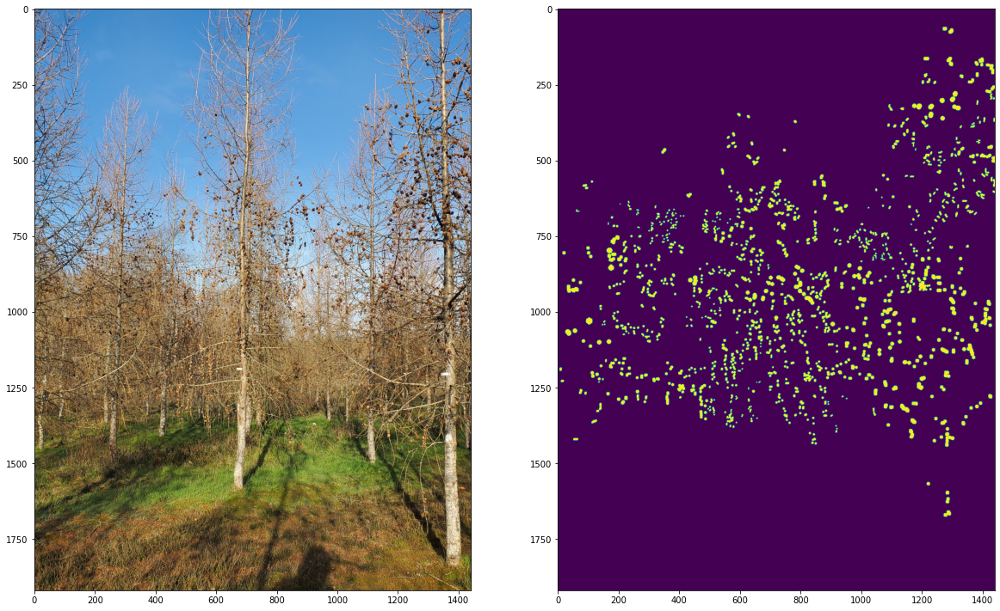

In [ ]:
# Mask
n=np.random.randint(len(masks_list))
mask_name=masks_list[n]
n=31
mask_name='tree'+str(n)+'_cone.ome.tiff'
mask_path=os.path.join(masks_dir,mask_name)
mask= imread(mask_path)[:,:]
mask = cv2.resize(mask, ( IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA)# mode='constant', preserve_range=True)
print('min mask=', np.min(mask), 'max mask=', np.max(mask))
print('mask shape=', np.shape(mask))

# Image
img_name=mask_name[:-14]+'.jpg'
img_path=os.path.join(images_dir,img_name)
img = imread(img_path)[:,:,:IMG_CHANNELS]
#img = img/255
img =cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA) #resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
print('min img=', np.min(img), 'max img=', np.max(img))
print('img shape=', np.shape(img))

fig, (ax1, ax2)=plt.subplots(1,2, figsize=(20,20))
ax1.imshow(img)
ax2.imshow(mask)


# Preprocessing images (try)

Text(0.5, 1.0, 'sobel')

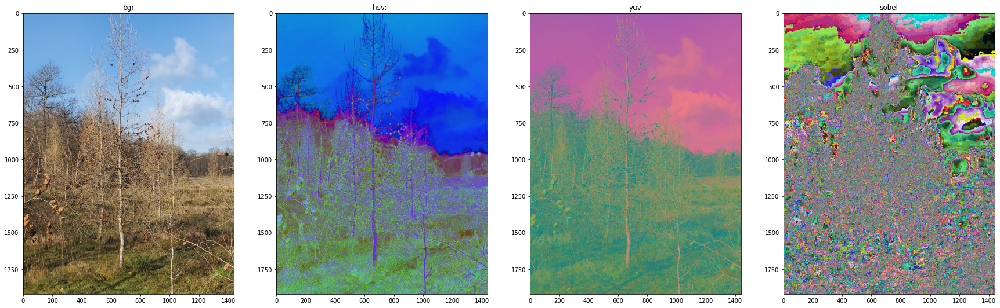

In [ ]:
n=np.random.randint(len(masks_list))
img_name=images_list[n]
img_path=os.path.join(images_dir,img_name)
img = imread(img_path)[:,:,:IMG_CHANNELS]
img =cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA) #resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) # Hue Saturation Value
yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV) # Y (luma component) and two chrominance components, called U (blue projection) and V (red projection) 
#sobel= cv2.Sobel(img, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5)
sobel=scipy.ndimage.sobel(img)
fig, (ax1, ax2, ax3, ax4)=plt.subplots(1,4,figsize=(30,30))
ax1.imshow(img)
ax1.set_title('bgr')
ax2.imshow(hsv)
ax2.set_title('hsv:  ')
ax3.imshow(yuv)
ax3.set_title('yuv')
ax4.imshow(sobel)
ax4.set_title('sobel')

(1920, 1440, 3) 1.0 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'sobelxy')

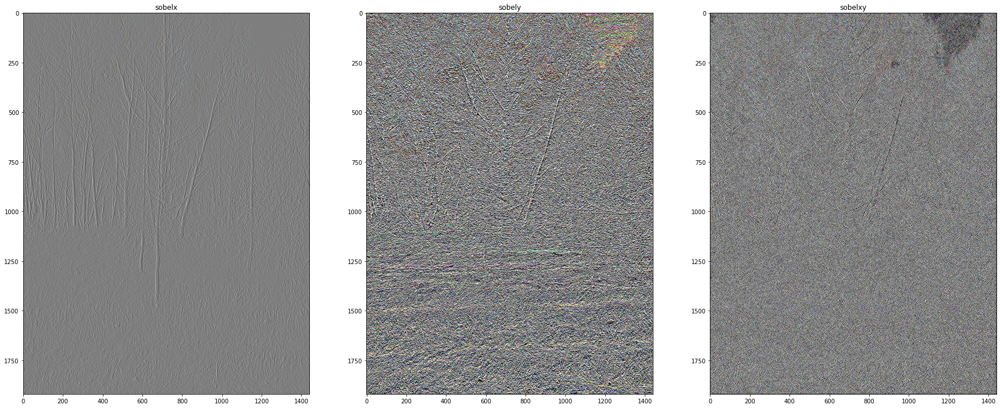

In [ ]:
n=np.random.randint(len(masks_list))
img_name=images_list[n]
img_path=os.path.join(images_dir,img_name)
img = imread(img_path)[:,:,:IMG_CHANNELS]
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
sobelx=(sobelx-np.min(sobelx))/(np.max(sobelx)-np.min(sobelx))
print(np.shape(sobelx), np.max(sobelx), np.min(sobelx))
sobely = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection
# Display Sobel Edge Detection Images
fig, (ax1, ax2, ax3)=plt.subplots(1,3,figsize=(30,30))
ax1.imshow(sobelx)
ax1.set_title('sobelx')
ax2.imshow(sobely)
ax2.set_title('sobely')
ax3.imshow(sobelxy)
ax3.set_title('sobelxy')

Create Input and Target data

In [ ]:
N=len(masks_list)
print(N)
Y= np.zeros((N,  IMG_HEIGHT,IMG_WIDTH, 1), dtype=np.bool) #np.bool)
X = np.zeros((N, IMG_HEIGHT,IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)

for n in range(N):
  mask_name=masks_list[n]
  img_name=mask_name[:-14]+'.jpg'
 
  img_path=os.path.join(images_dir, img_name)
  mask_path=os.path.join(masks_dir, mask_name)
  
  img = imread(img_path)[:,:,:IMG_CHANNELS]
  img = cv2.resize(img, ( IMG_WIDTH, IMG_HEIGHT ))

  X[n] =img

  mask= imread(mask_path)[:,:]
  mask = cv2.resize(mask, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_AREA ) #resize(mask, (IMG_HEIGHT, IMG_WIDTH,1), mode='constant', preserve_range=True)
  mask=np.reshape(mask,(IMG_HEIGHT, IMG_WIDTH, 1) )
  Y[n] = np.array(mask)


16


# Prepare data

Cut image by 4 to increase dataset / reduce number of NN parameters

In [ ]:
N1=len(masks_list)
N2=int(N1*CUT**2)
Y= np.zeros((N2 , NEW_IMG_HEIGHT ,NEW_IMG_WIDTH  , 1), dtype=np.bool) #np.bool)
X = np.zeros((N2 , NEW_IMG_HEIGHT ,NEW_IMG_WIDTH , IMG_CHANNELS), dtype=np.float32)

for n,p in zip(range(N1) , np.arange(0, N2,CUT**2 ) ):
  mask_name=masks_list[n]
  img_name=mask_name[:-14]+'.jpg'
 
  img_path=os.path.join(images_dir, img_name)
  mask_path=os.path.join(masks_dir, mask_name)
  
  img = imread(img_path)[:,:,:IMG_CHANNELS]
  img = cv2.resize(img, ( IMG_WIDTH,  IMG_HEIGHT))
  # sobel filtering
  #img = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3)
  #img=(img-np.min(img))/(np.max(img)-np.min(img))
  images = cut_image(img)

  mask= imread(mask_path)[:,:]
  mask = cv2.resize(mask, ( IMG_WIDTH,IMG_HEIGHT), interpolation = cv2.INTER_AREA ) #resize(mask, (IMG_HEIGHT, IMG_WIDTH,1), mode='constant', preserve_range=True)
  mask=np.array(np.reshape(mask,(IMG_HEIGHT , IMG_WIDTH, 1) ) )
  masks= cut_image(mask)
  for i in range(CUT**2):
    X[p+i] =images[i]
    Y[p+i] = masks[i]
 

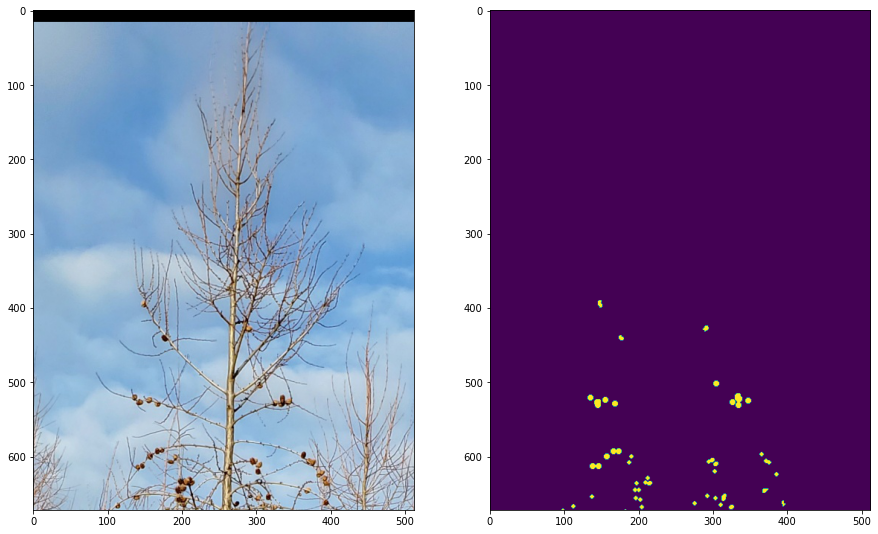

In [ ]:
n=np.random.randint(len(X))
# Mask
mask=Y[n]
mask=np.reshape(mask,(NEW_IMG_HEIGHT , NEW_IMG_WIDTH) )
# Image
img=X[n]
img =np.reshape(img ,(NEW_IMG_HEIGHT , NEW_IMG_WIDTH, IMG_CHANNELS) )/255

fig, (ax1, ax2)=plt.subplots(1,2, figsize=(15,15))
ax1.imshow(img)
ax2.imshow(mask)

Data Augmentation

In [ ]:
from keras.preprocessing import image
SPLIT=0.85
# Creating the training Image and Mask generator
image_datagen = image.ImageDataGenerator(shear_range=0.5, rotation_range=50, zoom_range=0.2, width_shift_range=0.2, height_shift_range=0.2, fill_mode='reflect')
mask_datagen = image.ImageDataGenerator(shear_range=0.5, rotation_range=50, zoom_range=0.2, width_shift_range=0.2, height_shift_range=0.2, fill_mode='reflect')

# Keep the same seed for image and mask generators so they fit together
seed=42
image_datagen.fit(X[:int(X.shape[0]*SPLIT)], augment=True, seed=seed)
mask_datagen.fit(Y[:int(Y.shape[0]*SPLIT)], augment=True, seed=seed)

x=image_datagen.flow(X[:int(X.shape[0]*SPLIT)],batch_size=BATCH_SIZE,shuffle=True, seed=seed)
y=mask_datagen.flow(Y[:int(Y.shape[0]*SPLIT)],batch_size=BATCH_SIZE,shuffle=True, seed=seed)


# Creating the validation Image and Mask generator
image_datagen_val = image.ImageDataGenerator()
mask_datagen_val = image.ImageDataGenerator()

image_datagen_val.fit(X[int(X.shape[0]*SPLIT):], augment=True, seed=seed)
mask_datagen_val.fit(Y[int(Y.shape[0]*SPLIT):], augment=True, seed=seed)

x_val=image_datagen_val.flow(X[int(X.shape[0]*SPLIT):],batch_size=BATCH_SIZE,shuffle=True, seed=seed)
y_val=mask_datagen_val.flow(Y[int(Y.shape[0]*SPLIT):],batch_size=BATCH_SIZE,shuffle=True, seed=seed)

#print('train size=', np.shape(x),'; val size=', np.shape(x_val))
#creating a training and validation generator that generate masks and images
train_generator = zip(x, y)
val_generator = zip(x_val, y_val)

# Model

## Create model

In [ ]:
# Conv2D
# Ox=(Ix-k+2*P)/s +1
# Oy=(Ix-k+2*P)/s +1
# Oz=N nb of filters
#Conv2DTranspose
 # Padding==Same:
# Ox= Ix * stride
# Padding==Valid
# Ox = (Ix-1) * s + k


inputs = Input((NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs) 

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s) #same size (padding=same)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1) #divide size by 2

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 672, 512, 3) 0                                            
__________________________________________________________________________________________________
lambda_3 (Lambda)               (None, 672, 512, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 672, 512, 16) 448         lambda_3[0][0]                   
__________________________________________________________________________________________________
dropout_19 (Dropout)            (None, 672, 512, 16) 0           conv2d_41[0][0]                  
____________________________________________________________________________________________

## deeper model

In [ ]:
#deeper model
inputs = Input((NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs) 

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s) #same size (padding=same)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1) #divide size by 2

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c41 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c41 = Dropout(0.2) (c41)
c41 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c41)
p41 = MaxPooling2D(pool_size=(2, 2)) (c41)

c5 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p41)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u61 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same') (c5)
u61 = concatenate([u61, c41])
c61 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u61)
c61 = Dropout(0.2) (c61)
c61 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c61)


u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c61)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 416, 320, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 416, 320, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 416, 320, 16) 448         lambda[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 416, 320, 16) 0           conv2d[0][0]                     
______________________________________________________________________________________________

## less deep model

In [ ]:
inputs = Input((NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs) 
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s) #same size (padding=same)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1) #divide size by 2

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)


c5 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)


u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c5)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 672, 512, 3) 0                                            
__________________________________________________________________________________________________
lambda_2 (Lambda)               (None, 672, 512, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 672, 512, 16) 448         lambda_2[0][0]                   
__________________________________________________________________________________________________
dropout_7 (Dropout)             (None, 672, 512, 16) 0           conv2d_15[0][0]                  
____________________________________________________________________________________________

## less less deep model

In [ ]:
inputs = Input((NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs) 
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s) #same size (padding=same)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1) #divide size by 2

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c5 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c5)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 416, 320, 3) 0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 416, 320, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 416, 320, 16) 448         lambda_1[0][0]                   
__________________________________________________________________________________________________
dropout_5 (Dropout)             (None, 416, 320, 16) 0           conv2d_11[0][0]                  
____________________________________________________________________________________________

### Import Model from directory

In [ ]:
weight_path='/content/drive/Shareddrives/fir_cone_detector/models/training/unet_k5.h5'
model=keras.models.load_model(weight_path, custom_objects={'dice_coefficient': dice_coefficient})

## Train

### Train with augmentation

In [ ]:
# Fit model 
# medium model: k3: val_loss: 0.0373 - val_dice_coefficient: 0.2628; k5: val_loss: 0.0381 - val_dice_coefficient: 0.2428
# less deep model: k3: val_loss: 0.0572 - val_dice_coefficient: 0.3090; k5 val_loss: 0.07 - val_dice_coefficient: 0.2; 
# less less deep model: k3 val_loss: 0.0387 - val_dice_coefficient: 0.2722; k5: val_loss: 0.0368 - val_dice_coefficient: 0.2940
earlystopper = EarlyStopping(patience=3, verbose=1)
checkpointer = ModelCheckpoint('UNet.h5', verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, validation_data=val_generator, validation_steps=10, steps_per_epoch=50, epochs=20, callbacks=[earlystopper, checkpointer])

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
50/50 [==============================] - 90s 2s/step - loss: 0.0466 - dice_coefficient: 0.2319 - val_loss: 0.0393 - val_dice_coefficient: 0.2571

Epoch 00001: val_loss improved from inf to 0.03929, saving model to UNet.h5
Epoch 2/20
50/50 [==============================] - 89s 2s/step - loss: 0.0502 - dice_coefficient: 0.2250 - val_loss: 0.0351 - val_dice_coefficient: 0.2468

Epoch 00002: val_loss improved from 0.03929 to 0.03514, saving model to UNet.h5
Epoch 3/20
50/50 [==============================] - 90s 2s/step - loss: 0.0473 - dice_coefficient: 0.2252 - val_loss: 0.0378 - val_dice_coefficient: 0.2681

Epoch 00003: val_loss did not improve from 0.03514
Epoch 4/20
50/50 [==============================] - 89s 2s/step - loss: 0.0478 - dice_coefficient: 0.2399 - val_loss: 0.0371 - val_dice_coefficient: 0.2533

Epoch 00004: val_loss did not improve from 0.03514
Epoch 5/20
50/50 [==============================] - 90s 2s/step - loss: 0.0464 - dice_coefficient: 0.2456 - val_lo

## Evaluate

Text(0.5, 0, 'epochs')

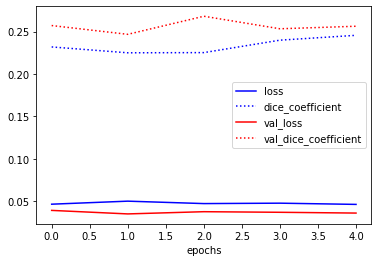

In [ ]:
loss=history.history['loss']; val_loss=history.history['val_loss']
dice=history.history['dice_coefficient']; val_dice=history.history['val_dice_coefficient']

plt.plot(loss,'b-', label='loss')
plt.plot(dice,'b:', label='dice_coefficient')
plt.plot(val_loss,'r-', label='val_loss')
plt.plot(val_dice,'r:', label='val_dice_coefficient')
plt.legend()
plt.xlabel('epochs')

In [ ]:
weight_path='/content/drive/Shareddrives/fir_cone_detector/models/training/unet_k3.h5'
model.save(weight_path)

## Predict

In [ ]:
weight_path='/content/drive/Shareddrives/fir_cone_detector/models/training/unet_k3_medium.h5'
model=keras.models.load_model(weight_path, custom_objects={'dice_coefficient': dice_coefficient})

time of execution= 1.88 s


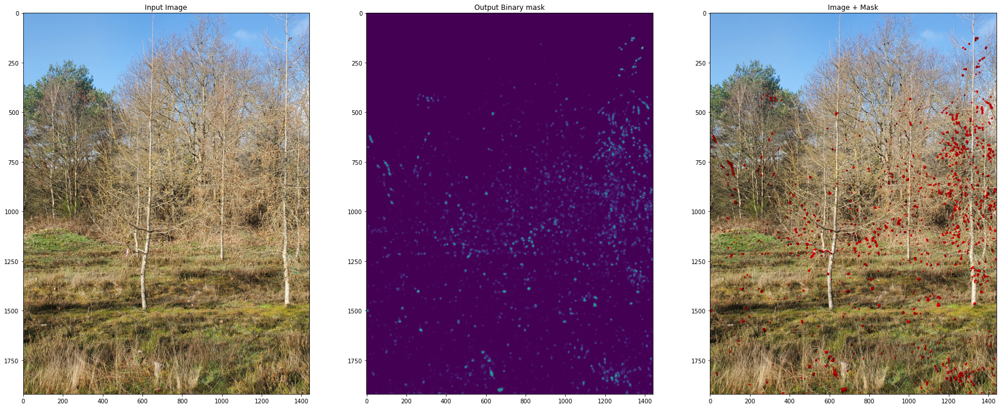

In [ ]:
t0=time.perf_counter()

# pick image
n=np.random.randint(len(images_list))
img_name=images_list[n]
img_path=os.path.join(images_dir, img_name)
img = imread(img_path)[:,:,:IMG_CHANNELS]
img =cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA)

# compute mask
images = cut_image(img)
masks = []
for im in images:
  im = np.reshape(im,  (1, NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS) )
  mask = model.predict(im)
  masks.append(np.reshape(mask, (NEW_IMG_HEIGHT, NEW_IMG_WIDTH)))
mask = assemble_mask(masks)

# assemble mask+img
img_and_mask=np.copy(img)
CX, CY=np.where(mask>0.1*np.max(mask))
for cx,cy in zip(CX, CY):
  img_and_mask[cx, cy,1]=0 # mute blue
  img_and_mask[cx, cy,2]=0 # mute mute green

# plot
fig, (ax1, ax2, ax3)=plt.subplots(1,3,figsize=(30,30))
ax1.imshow(img)
ax1.set_title('Input Image')
ax2.imshow(mask)
ax2.set_title('Output Binary mask')
ax3.imshow(img_and_mask)
ax3.set_title('Image + Mask')
t1=time.perf_counter()
print('time of execution=', round(t1-t0,2) , 's')

## Count

img name : tree46.jpg
Prediction:  1178  cones found
time of execution= 1.14 s


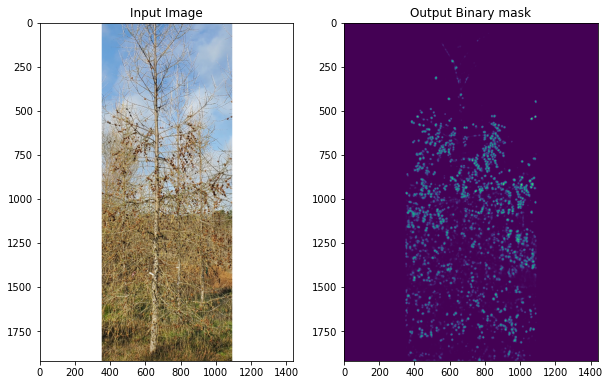

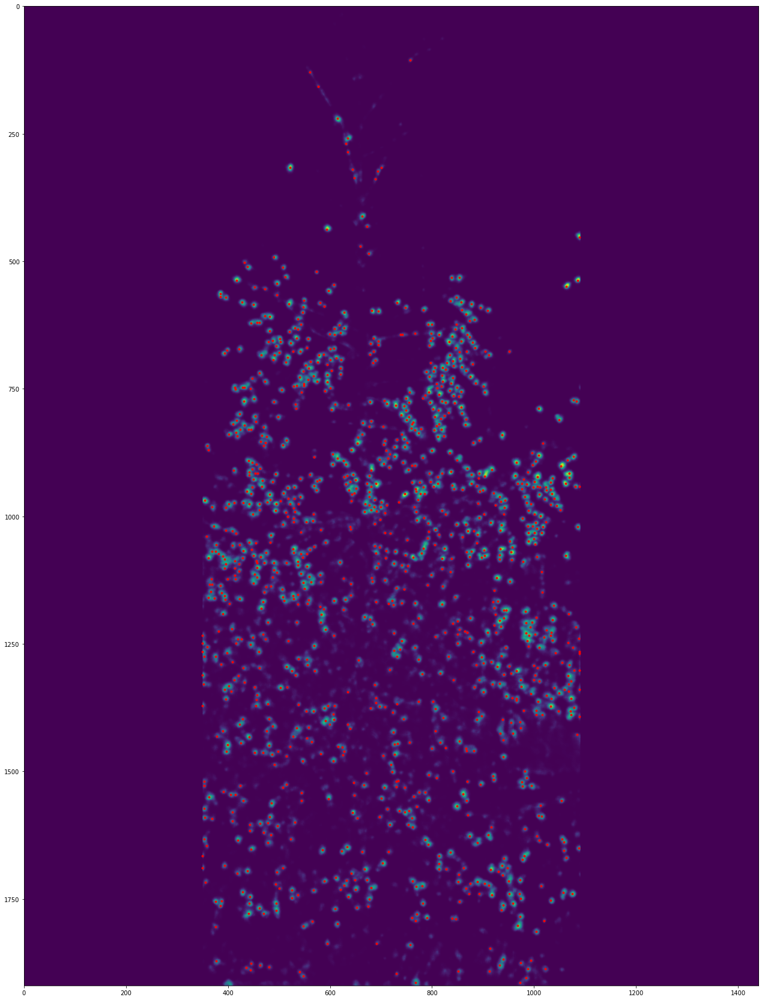

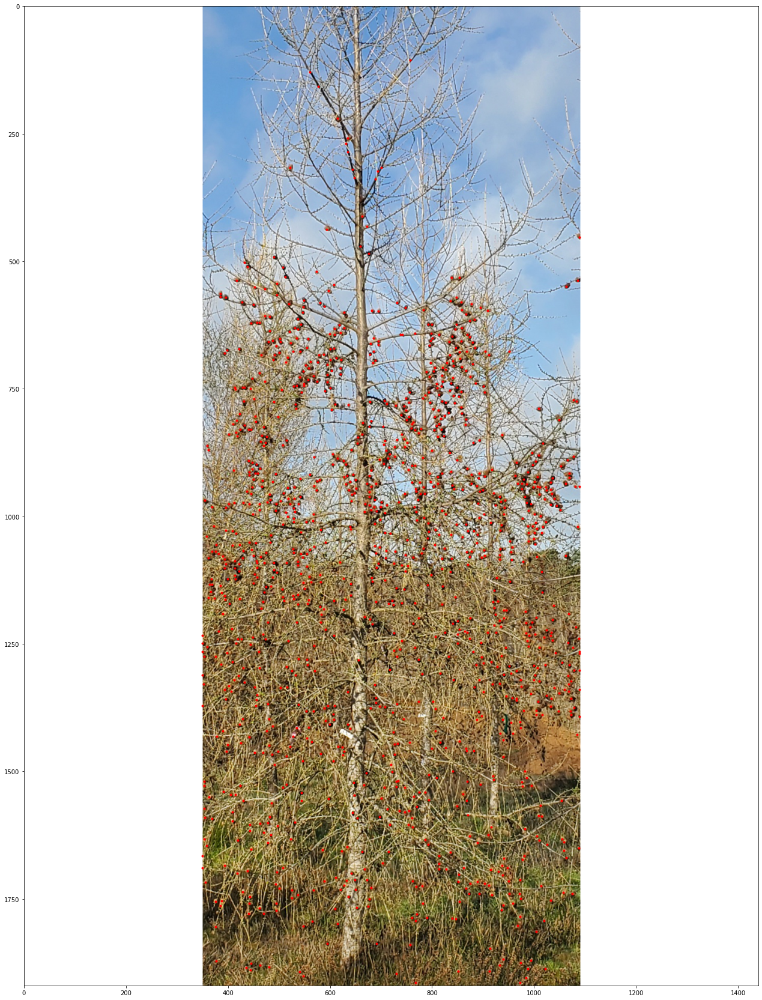

In [ ]:
t0=time.perf_counter()
# pick image
n=np.random.randint(len(images_list))
img_name=images_list[n]
img_path=os.path.join(images_dir, img_name)
img = imread(img_path)[:,:,:IMG_CHANNELS]
img =cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA)

# compute mask
images = cut_image(img)
masks = []
x_coord =[]; y_coord=[]
for im in images:
  im = np.reshape(im,  (1, NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS) )
  mask = model.predict(im)
  mask= np.reshape(mask, (NEW_IMG_HEIGHT, NEW_IMG_WIDTH))
  masks.append(mask)
  
mask = assemble_mask(masks)
#select middle tree
crop=350
img[:,:crop,:]=np.ones_like(img[:,:crop,:])*255
img[:,-crop:,:]=np.ones_like(img[:,-crop:,:])*255
mask[:, :crop]=np.zeros_like(mask[:, :crop])
mask[:, -crop:]=np.zeros_like(mask[:, -crop:])

# count with local minima
coordinates = peak_local_max(mask, min_distance=3, threshold_abs=np.max(mask)*0.2) #np.max(mask)*0.2)
print('img name :', img_name)
print('Prediction: ' ,len(coordinates),' cones found')

# plot

fig1, (ax1, ax2)=plt.subplots(1,2,figsize=(10,10))
ax1.imshow(img)
ax1.set_title('Input Image')
ax2.imshow(mask)
ax2.set_title('Output Binary mask')
t1=time.perf_counter()
print('time of execution=', round(t1-t0,2) , 's')

fig2, (ax1)=plt.subplots(1,1,figsize=(30,30))
ax1.imshow(mask)
ax1.plot(coordinates[:, 1], coordinates[:, 0], 'r.')

fig3, (ax1)=plt.subplots(1,1,figsize=(30,30))
ax1.imshow(img)
ax1.plot(coordinates[:, 1], coordinates[:, 0], 'r.')


# Produce result

In [ ]:
weight_path='/content/drive/Shareddrives/fir_cone_detector/models/training/unet_k5.h5'
model=keras.models.load_model(weight_path, custom_objects={'dice_coefficient': dice_coefficient})

In [ ]:
LIST=[]
for id in range(1, len(images_list)+1):
  img_name='tree'+str(id)+'.jpg'
  img_path=os.path.join(images_dir, img_name)
  img = imread(img_path)[:,:,:IMG_CHANNELS]
  img =cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation = cv2.INTER_AREA)
  
  # compute mask
  images = cut_image(img)
  masks = []
  x_coord =[]; y_coord=[]
  for im in images:
    im = np.reshape(im,  (1, NEW_IMG_HEIGHT, NEW_IMG_WIDTH, IMG_CHANNELS) )
    mask = model.predict(im)
    mask= np.reshape(mask, (NEW_IMG_HEIGHT, NEW_IMG_WIDTH))
    masks.append(mask)
    
  mask = assemble_mask(masks)
  #select middle tree
  crop=370
  mask[:, :crop]=np.zeros_like(mask[:, :crop])
  mask[:, -crop:]=np.zeros_like(mask[:, -crop:])
  # count with local minima
  coordinates = peak_local_max(mask, min_distance=6, threshold_abs=np.max(mask)*0.2) #np.max(mask)*0.2)
  nb = len(coordinates)
  LIST.append([id, nb])
  print('tree',id,': ', nb, ' cones')

# save data to csv file
df= pd.DataFrame(data=LIST, index=None, columns=['tree_id', 'nb_of_cones'])
df.to_csv('prediction_UNet_k5.csv', index=False)



tree 1 :  333  cones
tree 2 :  287  cones
tree 3 :  276  cones
tree 4 :  597  cones
tree 5 :  346  cones
tree 6 :  800  cones
tree 7 :  794  cones
tree 8 :  507  cones
tree 9 :  61  cones
tree 10 :  292  cones
tree 11 :  892  cones
tree 12 :  506  cones
tree 13 :  218  cones
tree 14 :  282  cones
tree 15 :  127  cones
tree 16 :  843  cones
tree 17 :  908  cones
tree 18 :  451  cones
tree 19 :  589  cones
tree 20 :  173  cones
tree 21 :  560  cones
tree 22 :  362  cones
tree 23 :  192  cones
tree 24 :  952  cones
tree 25 :  371  cones
tree 26 :  889  cones
tree 27 :  440  cones
tree 28 :  875  cones
tree 29 :  407  cones
tree 30 :  521  cones
tree 31 :  639  cones
tree 32 :  236  cones
tree 33 :  644  cones
tree 34 :  496  cones
tree 35 :  614  cones
tree 36 :  129  cones
tree 37 :  111  cones
tree 38 :  132  cones
tree 39 :  751  cones
tree 40 :  139  cones
tree 41 :  319  cones
tree 42 :  557  cones
tree 43 :  437  cones
tree 44 :  889  cones
tree 45 :  631  cones
tree 46 :  759  cone

# Draft

In [ ]:
def highlight_peaks(mask):
  h,w=np.shape(mask)
  initializer = tf.keras.initializers.Ones()
  layer = Conv2D(1, 8, activation='linear',input_shape=(h,w), kernel_initializer=initializer,bias_initializer='zeros', padding='same') 
  x=np.reshape(mask,  (1, h,w,1 ) )
  y=layer(x)
  y = np.reshape(y, (h,w))
  #y=y>0.3*np.max(y)
  return y

# transfomration
new_mask=highlight_peaks(mask)